<a href="https://colab.research.google.com/github/matija-dam/leptiri/blob/master/ButterflyDetectionOnly_e25.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 **Initial setup**

mount google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

clone Mask R-CNN from github

In [ ]:
%%shell
# clone Mask_RCNN repo and install packages
git clone https://github.com/matterport/Mask_RCNN
cd Mask_RCNN
python setup.py install 
%cd /content/Mask_RCNN
!cp /content/Mask_RCNN/samples/balloon/balloon.py ./butterfly.py
!sed -i -- 's/balloon/butterfly/g' butterfly.py
!sed -i -- 's/Balloon/Butterfly/g' butterfly.py
!pip install q keras==2.2.5
%tensorflow_version 1.x

copy weights from project

In [32]:
%cd /content/drive/My Drive/Classroom/Proj1 - Buterfly/BFdataset/datasetV2

!cp "Copy of mask_rcnn_butterfly_0025.h5" /content/Mask_RCNN/mask_rcnn_butterfly.h5

/content/drive/My Drive/Classroom/Proj1 - Buterfly/BFdataset/datasetV2


copy training/validating data

In [ ]:
%mkdir /content/Mask_RCNN/dataset/
%mkdir /content/Mask_RCNN/dataset/train/
%mkdir /content/Mask_RCNN/dataset/val/

In [ ]:
%cd /content/drive/My Drive/Classroom/Proj1 - Buterfly/BFdataset/TstSet
%cp -av * /content/Mask_RCNN/dataset/val/

# Butterfly detection using Mask R-CNN

In [33]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append("./Mask_RCNN/")  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

import butterfly 

%matplotlib inline 


# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")
Butterfly_WEIGHTS_PATH = "/content/Mask_RCNN/mask_rcnn_butterfly.h5"
config = butterfly.ButterflyConfig()
Butterfly_DIR = os.path.join(ROOT_DIR, "/content/Mask_RCNN/dataset")
# Override the training configurations with a few
# changes for inferencing.
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
DEVICE = "/gpu:0"
TEST_MODE = "inference"
config.display()
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

# Load validation dataset
dataset = butterfly.ButterflyDataset()
dataset.load_butterfly(Butterfly_DIR, "val")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))
MODEL_DIR = "/content/Mask_RCNN"

# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)
print("Loading weights ", Butterfly_WEIGHTS_PATH)
model.load_weights(Butterfly_WEIGHTS_PATH, by_name=True)


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

**detect butterfly on ALL images in val directory**

12

*** No instances to display *** 

gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (1, 4)                min:  466.00000  max:  686.00000  int32
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  bool
AP: 0.0

*** No instances to display *** 

gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (1, 4)                min:  362.00000  max:  616.00000  int32
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  bool
AP: 0.0

*** No instances to display *** 

gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (1, 4)                min:  377.00000  max:  720.00000  int32
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  bool
AP: 0.0
gt_class_id              

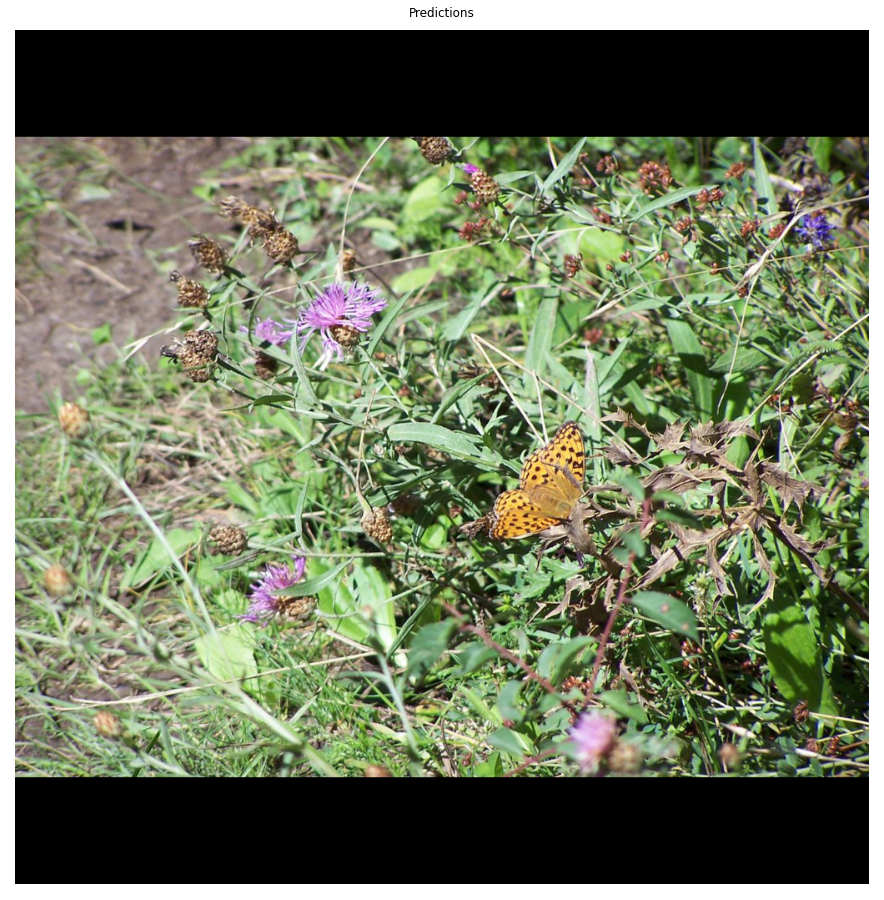

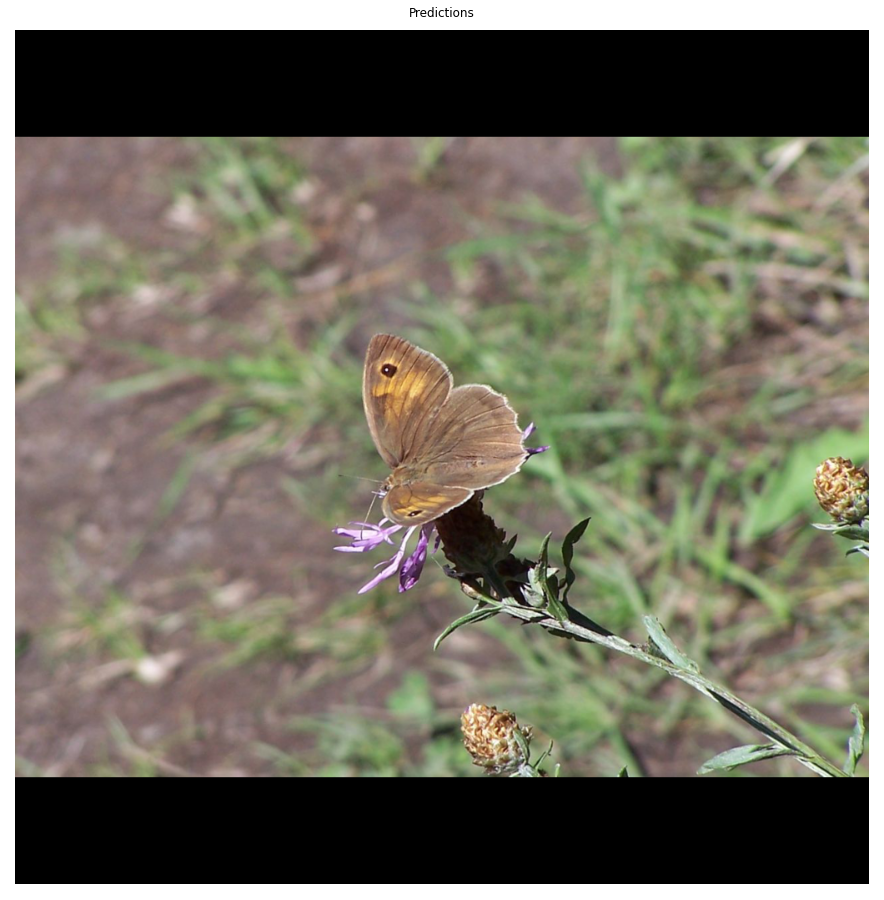

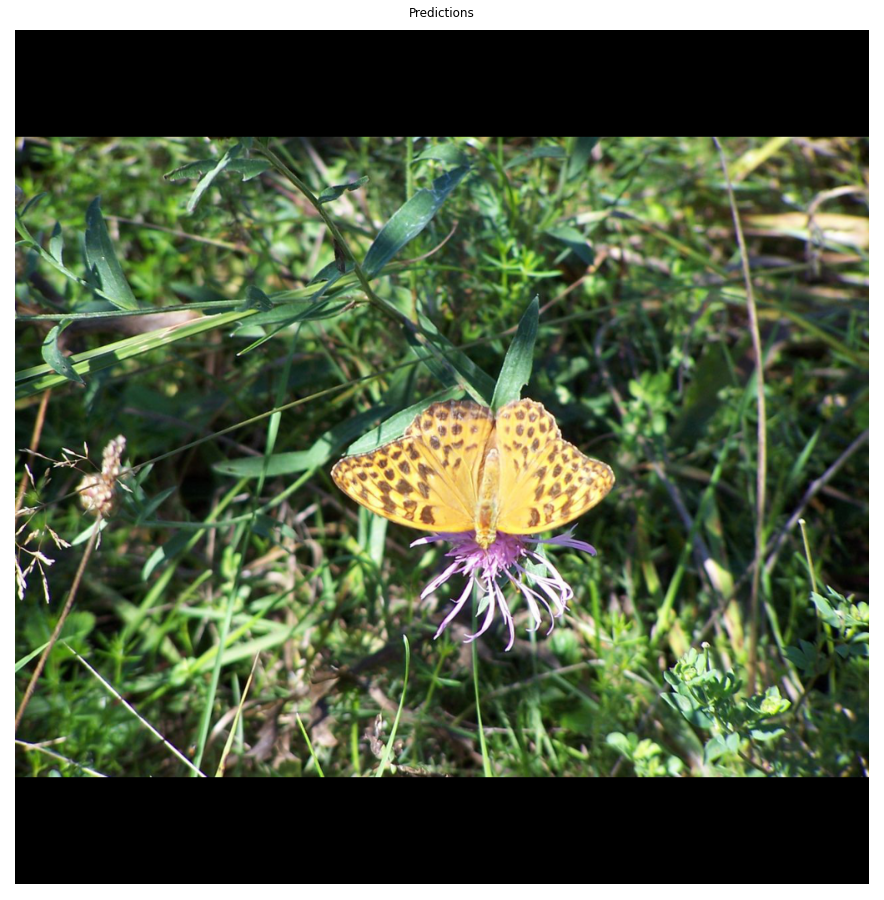

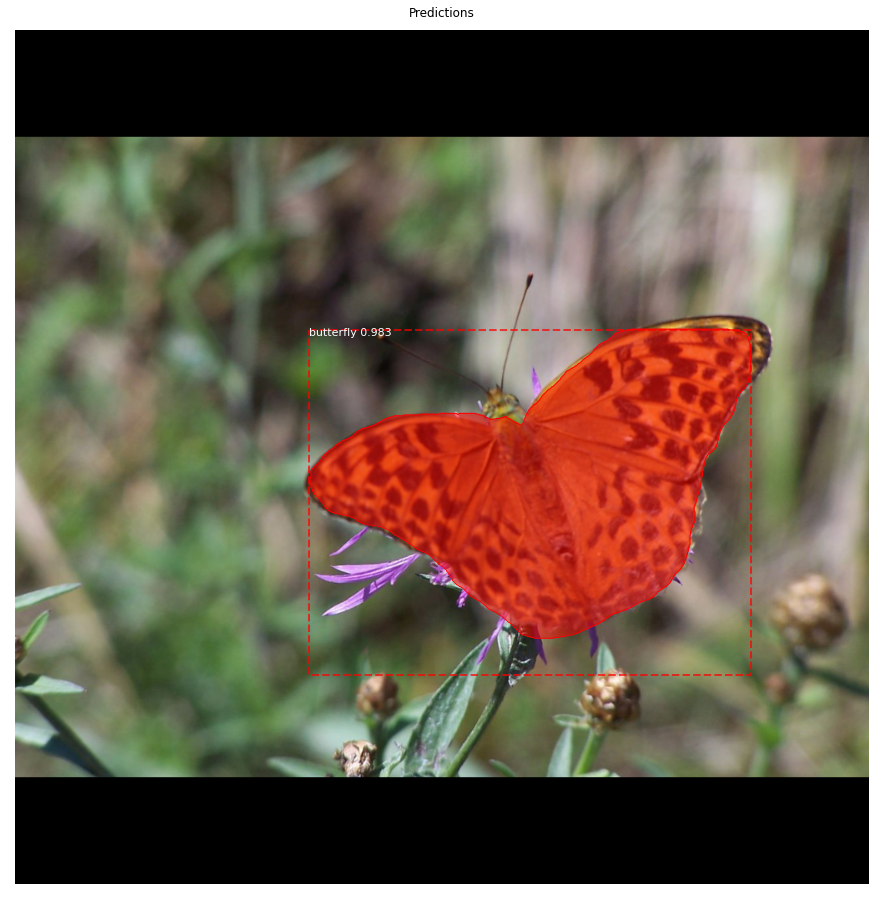

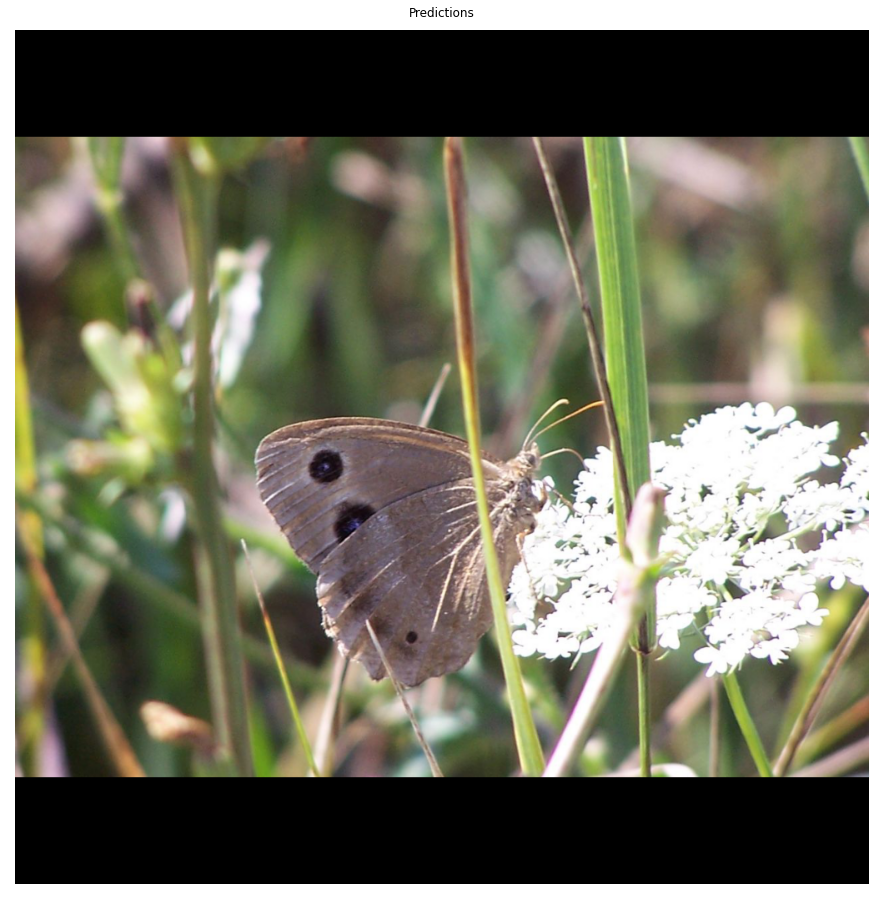

...

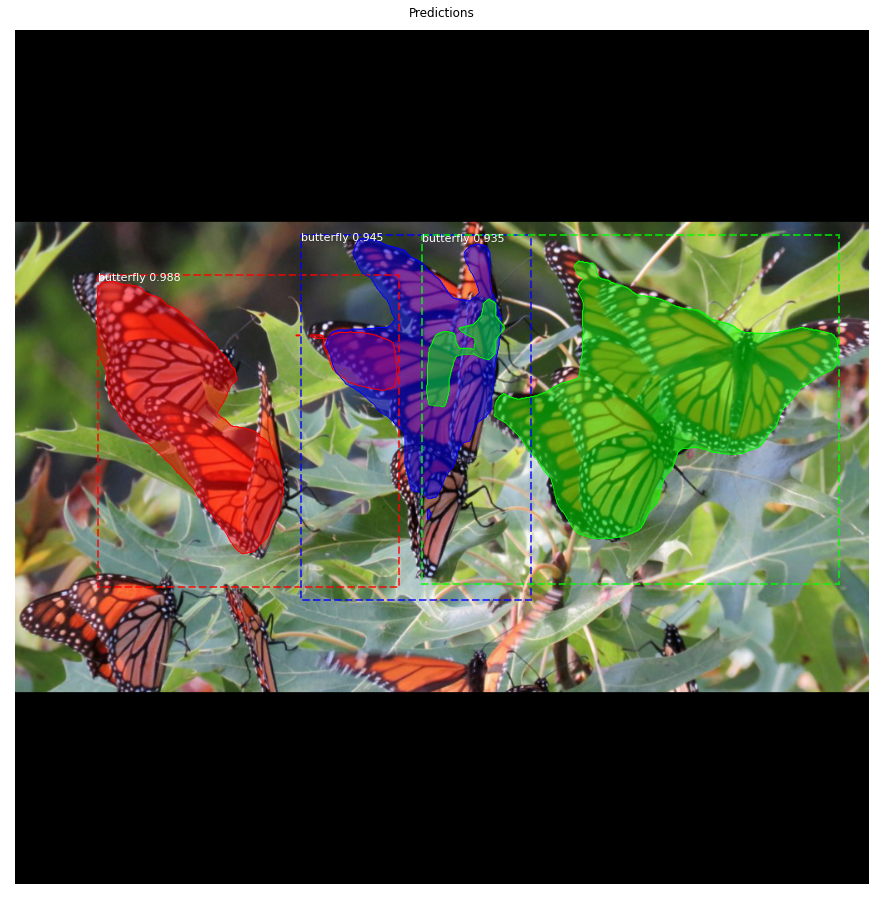

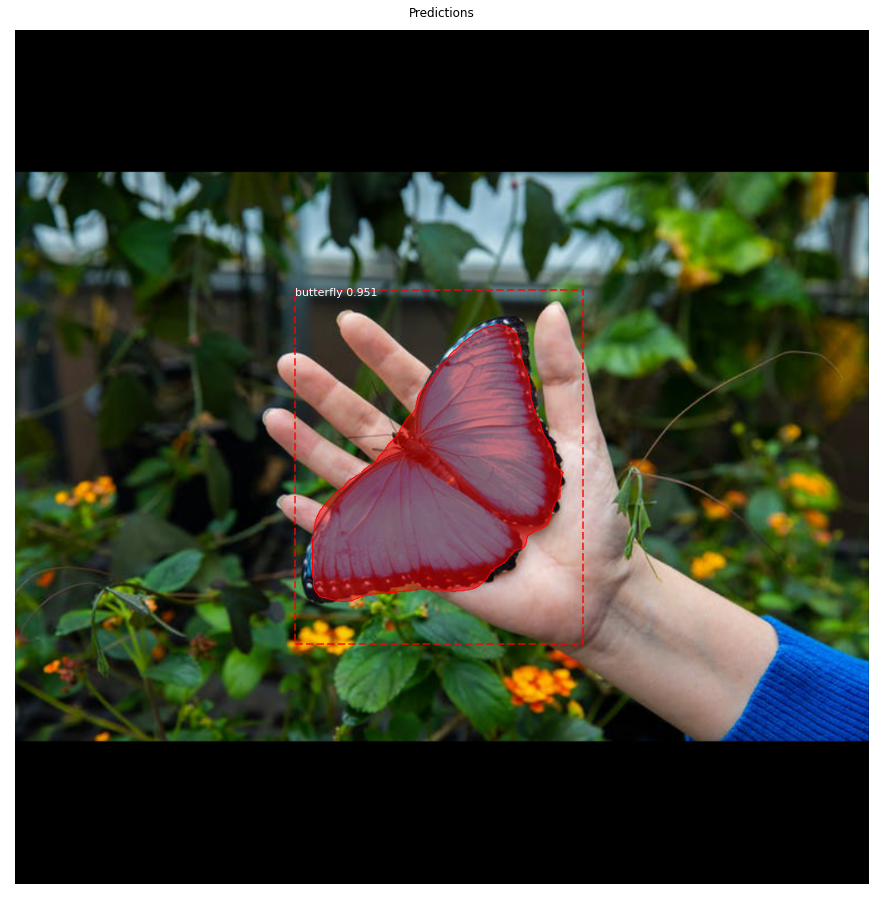

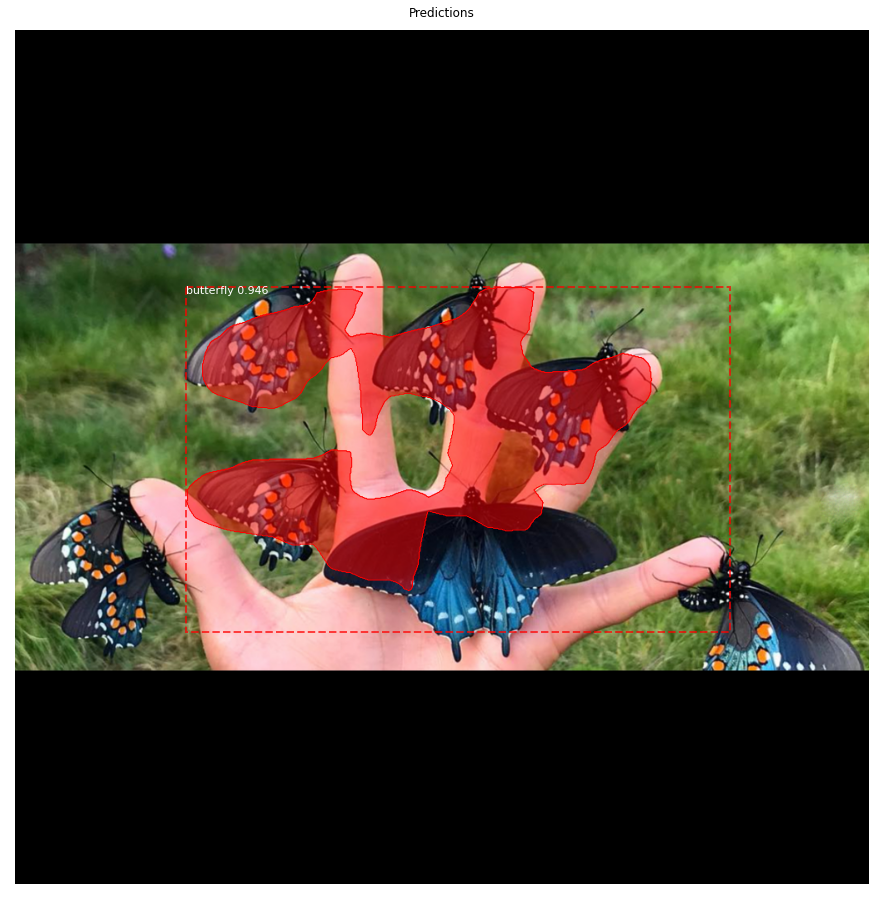

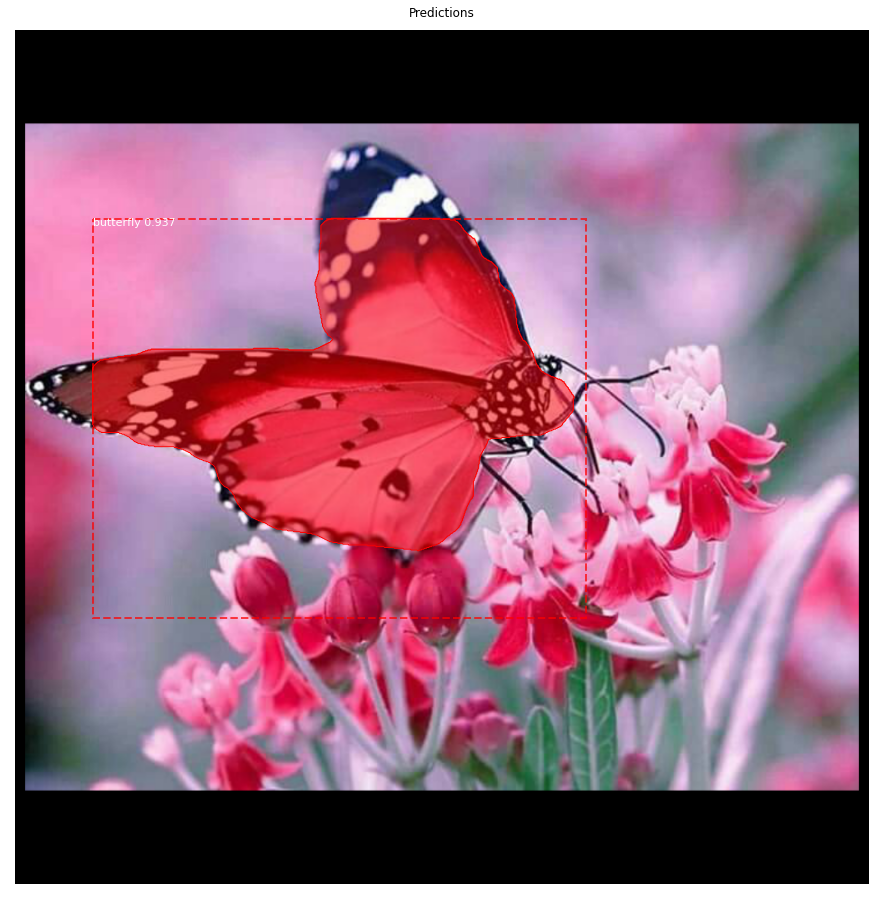

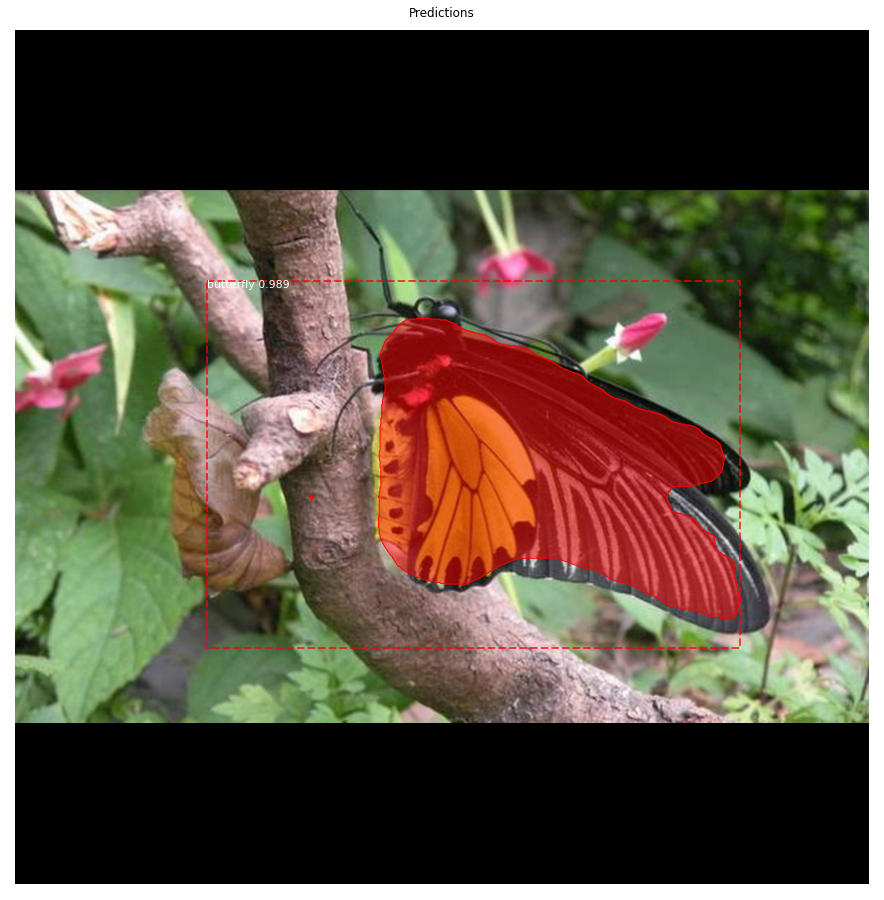

In [34]:
threshold = 0.85
APs = []
i = len(dataset.image_ids)
print(i)
image_id = 0
while image_id < i:
    
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
    info = dataset.image_info[image_id]
    #print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id,dataset.image_reference(image_id)))
    molded_images = np.expand_dims(modellib.mold_image(image, config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)

    # Display results
    ax = get_ax(1)
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                dataset.class_names, r['scores'], ax=ax,
                                title="Predictions")
    log("gt_class_id", gt_class_id)
    log("gt_bbox", gt_bbox)
    log("gt_mask", gt_mask)

    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'],threshold)
    
    print("AP:", AP)
    APs.append(AP)
    image_id += 1


print("mAP: ", np.mean(APs))